# Import Library

In [ ]:
!pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.9 MB 18.8 MB/s 
     |████████████████████████████████| 758 kB 56.1 MB/s 
     |████████████████████████████████| 575 kB 76.5 MB/s 
     |████████████████████████████████| 280 kB 54.3 MB/s 
     |████████████████████████████████| 275 kB 62.5 MB/s 
     |████████████████████████████████| 9.9 MB 55.1 MB/s 
     |████████████████████████████████| 6.5 MB 59.4 MB/s 
     |████████████████████████████████| 3.6 MB 34.2 MB/s 
     |████████████████████████████████| 261 kB 59.8 MB/s 
     |████████████████████████████████| 1.6 MB 39.9 MB/s 
     |████████████████████████████████| 132 kB 79.7 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=b67a9961332ff5016dcd1b52bfd22f6dbab1fc482dcc4537c27306a02a5276f0
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Success

In [ ]:
from imblearn.over_sampling import RandomOverSampler
import pandas as pd
from collections import Counter
from sklearn.model_selection import train_test_split,cross_val_score,RepeatedStratifiedKFold
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import f1_score, accuracy_score
import seaborn as sns
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.ensemble import RandomForestClassifier

from interpret.blackbox import LimeTabular
import shap

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler,LabelEncoder
from sklearn.compose import ColumnTransformer
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from interpret.privacy import DPExplainableBoostingClassifier, DPExplainableBoostingRegressor
from sklearn.ensemble import StackingClassifier

In [ ]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
from interpret.version import __version__

# drive access

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/My Drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Makes sure we see all columns
pd.set_option('display.max_columns', None)

In [ ]:
dataset= pd.read_csv('data/healthcare-dataset-stroke-data.csv')

In [ ]:
dataset.shape

(5110, 12)

In [ ]:
dataset.columns

Index(['id', 'gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [ ]:
dataset.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [ ]:
dataset['Residence_type'].unique

<bound method Series.unique of 0       Urban
1       Rural
2       Rural
3       Urban
4       Rural
        ...  
5105    Urban
5106    Urban
5107    Rural
5108    Rural
5109    Urban
Name: Residence_type, Length: 5110, dtype: object>

In [ ]:
print(set(dataset['Residence_type']))

{'Urban', 'Rural'}


In [ ]:
# Let's get an overview of features datatype
dataset.dtypes

id                     int64
gender                object
age                  float64
hypertension           int64
heart_disease          int64
ever_married          object
work_type             object
Residence_type        object
avg_glucose_level    float64
bmi                  float64
smoking_status        object
stroke                 int64
dtype: object

We can see that Hypertension, heart disease and stroke have an integer data type but we know that they are categorical variables. So lets convert them to object datatype.

In [ ]:
columns_to_convert = ['hypertension', 'heart_disease', 'stroke']
dataset[columns_to_convert] = dataset[columns_to_convert].astype(str)

In [ ]:
# summary statistics
dataset.describe().style.background_gradient(cmap = "plasma")

,id,age,avg_glucose_level,bmi
count,5110.000000,5110.000000,5110.000000,4909.000000
mean,36517.829354,43.226614,106.147677,28.893237
std,21161.721625,22.612647,45.283560,7.854067
min,67.000000,0.080000,55.120000,10.300000
25%,17741.250000,25.000000,77.245000,23.500000
50%,36932.000000,45.000000,91.885000,28.100000
75%,54682.000000,61.000000,114.090000,33.100000
max,72940.000000,82.000000,271.740000,97.600000


In [ ]:
# Drop ID - I think, ID won't useful in our analysis.
dataset.drop('id', axis= 1, inplace= True)


In [ ]:
# categorical and numeric features
cat_features = dataset.select_dtypes(exclude="number").columns
num_cols = dataset.select_dtypes(include="number").columns
print('Categorical Features are: ', cat_features)
print('Numerical Features are: ', num_cols)

Categorical Features are:  Index(['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type',
       'Residence_type', 'smoking_status', 'stroke'],
      dtype='object')
Numerical Features are:  Index(['age', 'avg_glucose_level', 'bmi'], dtype='object')


In [ ]:
# checking for null values
dataset.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [ ]:
bmi_mean=dataset['bmi'].mean()
dataset['bmi']=dataset['bmi'].fillna(bmi_mean)

In [ ]:
# Checking value in each categorical feature
cat_cols = cat_features[:-1]
for col in cat_cols:
    print(f'============{col}============\n {dataset[col].value_counts()}\n')

============gender============
 Female    2994
Male      2115
Other        1
Name: gender, dtype: int64

============hypertension============
 0    4612
1     498
Name: hypertension, dtype: int64

============heart_disease============
 0    4834
1     276
Name: heart_disease, dtype: int64

============ever_married============
 Yes    3353
No     1757
Name: ever_married, dtype: int64

============work_type============
 Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: work_type, dtype: int64

============Residence_type============
 Urban    2596
Rural    2514
Name: Residence_type, dtype: int64

============smoking_status============
 never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: smoking_status, dtype: int64



In [ ]:
dataset.drop(dataset.loc[dataset['gender'] == 'Other'].index, inplace= True)


In [ ]:
# convert target variabe stroke into integer format
dataset['stroke'] = dataset['stroke'].map({'0': 0, '1': 1})

In [ ]:
dataset['stroke'].value_counts()

0    4860
1     249
Name: stroke, dtype: int64

In [ ]:
# splitting the data into X and y
X = dataset.drop('stroke', axis=1)
y = dataset['stroke']

In [ ]:
X.shape

(5109, 10)

In [ ]:
# For the categorical features, we will encode them with One-Hot encoding
categorical_pipeline = Pipeline(
    steps=[
        ("onehot-encoder", OneHotEncoder(handle_unknown="ignore", sparse=False,drop='first')),
    ]
)

In [ ]:
# For the numeric features, specifically 'bmi' we will impute the missing values with the mode of the column
# and StandardScaler so that the features have 0 mean and a variance of 1:
numeric_pipeline = Pipeline(
    steps=[
           ("imputer", SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
           ("scaler", StandardScaler())
         ]
)

In [ ]:
# Next, we will input these along with their corresponding pipelines into a ColumnTransFormer instance
full_processor = ColumnTransformer(
    transformers=[
        ("numeric", numeric_pipeline, num_cols),
        ("categorical", categorical_pipeline, cat_cols),
    ]
)

In [ ]:
feature_names=X.columns

In [ ]:
feature_names=np.array(feature_names)

In [ ]:
feature_names

array(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status'], dtype=object)

In [ ]:
# Apply preprocessing
X_processed = full_processor.fit_transform(X)
y_processed = y.values.reshape(-1,1)
print('X Shape: ', X_processed.shape)
print('y shape: ', y_processed.shape)

X Shape:  (5109, 15)
y shape:  (5109, 1)


In [ ]:
X

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.893237,never smoked
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.500000,never smoked
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.400000,smokes
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked
...,...,...,...,...,...,...,...,...,...,...
5105,Female,80.0,1,0,Yes,Private,Urban,83.75,28.893237,never smoked
5106,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.000000,never smoked
5107,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.600000,never smoked
5108,Male,51.0,0,0,Yes,Private,Rural,166.29,25.600000,formerly smoked


In [ ]:
dataset.isnull().sum()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [ ]:
unique, counts = np.unique(y, return_counts=True)

In [ ]:
y.value_counts()

0    4860
1     249
Name: stroke, dtype: int64

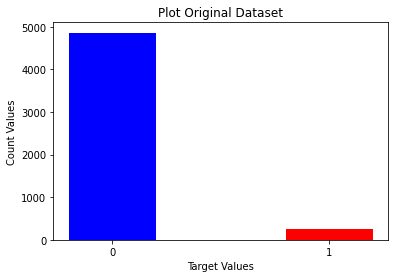

In [ ]:
plt.bar(unique, counts, color =['blue','red'],
        width = 0.4)
label=['0','1']
plt.xticks(unique)
plt.xlabel("Target Values")
plt.ylabel("Count Values")
plt.title("Plot Original Dataset")
plt.savefig("originaldata.png")
plt.show()

In [ ]:
# Oversampling of Minority Class
ros = RandomOverSampler(sampling_strategy='minority')

X_sample, y_sample = ros.fit_resample(X_processed, y_processed)
print('Original Y Count: ', np.unique(y_processed, return_counts=True))
print('OverSample Y Count: ', np.unique(y_sample, return_counts=True))

Original Y Count:  (array([0, 1]), array([4860,  249]))
OverSample Y Count:  (array([0, 1]), array([4860, 4860]))


In [ ]:
show

<function interpret.visual.interactive.show(explanation, key=-1, **kwargs)>

In [ ]:
unique, counts = np.unique(y_sample, return_counts=True)

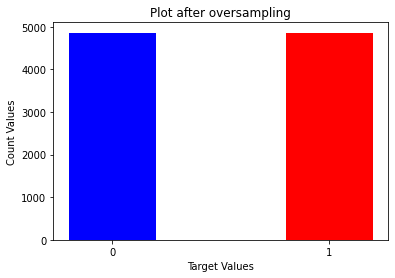

In [ ]:
plt.bar(unique, counts, color =['blue','red'],
        width = 0.4)
label=['0','1']
plt.xticks(unique)
plt.xlabel("Target Values")
plt.ylabel("Count Values")
plt.title("Plot after oversampling")
plt.show()

# Split

In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size = 0.3, stratify = y_sample, random_state = 2022)

In [ ]:
X_train.shape

(6804, 15)

In [ ]:
X_test.shape

(2916, 15)

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Models
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
models = [ BernoulliNB(),
           GaussianNB(),
           KNeighborsClassifier(n_neighbors = 3),
           MLPClassifier(random_state=1, max_iter=300),
           LogisticRegression(random_state=2021, feature_names=feature_names, penalty='l1', solver='liblinear'),
           ClassificationTree(),
           SVC(probability=True),
           DecisionTreeClassifier(),
           RandomForestClassifier(random_state=2022)]

model_names=['Bernoulli NB','Gaussian NB','KNN', 'MLP','Logistic Regression',' Classification Tree','SVM','Decision Tree','Random Forest']

In [ ]:
def build_models(models, model_names):
    # lets create an empty lists to append the results
    roc_auc_scores  = []
    accuracy_scores = []
    results = {}

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,10))
    # use enumerate() and zip() function to iterate the lists
    for idx, (ml_model_names, ml_models, ax) in enumerate(zip(model_names, models, axes.flatten())):
        clf = models[idx]
        clf.fit(X_train,y_train)
        y_pred = clf.predict(X_test)
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        roc_auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)

        plot_confusion_matrix(clf,
                              X_test,
                              y_test,
                              ax=ax,
                              cmap='Blues')
        ax.title.set_text(ml_model_names)

        #print("Model: {}".format(ml_model_names))
        #print("Accuracy: {}".format(accuracy))
        #print("Roc Auc Score: {}".format(roc_auc))
        #print('\n')


        roc_auc_scores.append(roc_auc)
        accuracy_scores.append(accuracy)

    results = {'Model':model_names,
           'ROC AUC Score':roc_auc_scores,
           'Accuracy Score':accuracy_scores}
    plt.tight_layout()
    plt.show()
    # Put the roc_auc_scores and accuracy scores in a data frame.
    models_scores_df = pd.DataFrame(results)
    return models_scores_df

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, plot_confusion_matrix

import warnings
warnings.filterwarnings('ignore')

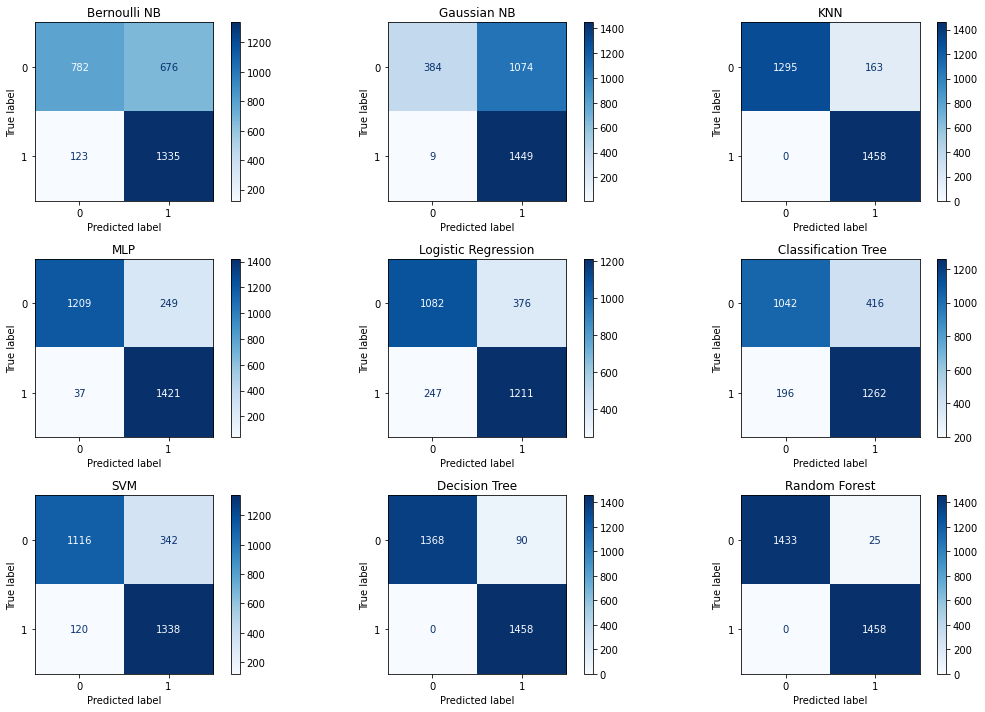

In [ ]:
models_scores_df = build_models(models, model_names)

# Preprocessing

In [ ]:
dataset['bmi'].isnull().sum()

0

In [ ]:

# %% Show general statistics
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5109 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             5109 non-null   object 
 1   age                5109 non-null   float64
 2   hypertension       5109 non-null   object 
 3   heart_disease      5109 non-null   object 
 4   ever_married       5109 non-null   object 
 5   work_type          5109 non-null   object 
 6   Residence_type     5109 non-null   object 
 7   avg_glucose_level  5109 non-null   float64
 8   bmi                5109 non-null   float64
 9   smoking_status     5109 non-null   object 
 10  stroke             5109 non-null   int64  
dtypes: float64(3), int64(1), object(7)
memory usage: 479.0+ KB


col:  gender


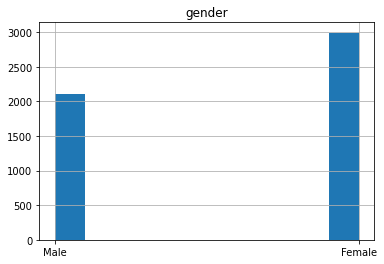

col:  age


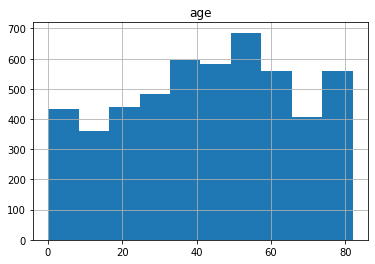

col:  hypertension


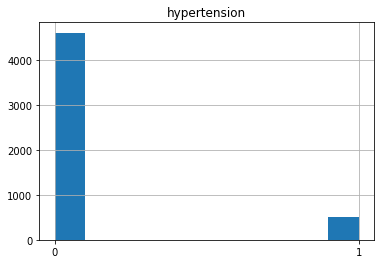

col:  heart_disease


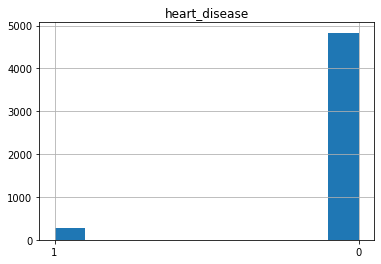

col:  ever_married


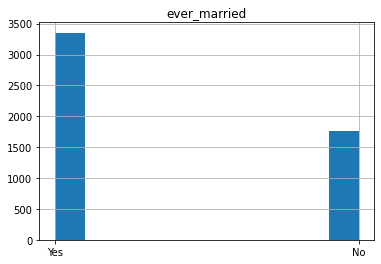

col:  work_type


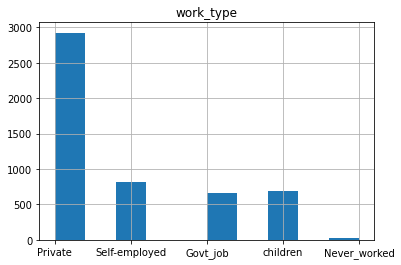

col:  Residence_type


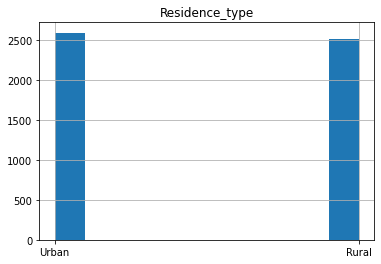

col:  avg_glucose_level


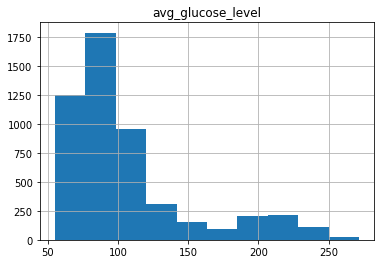

col:  bmi


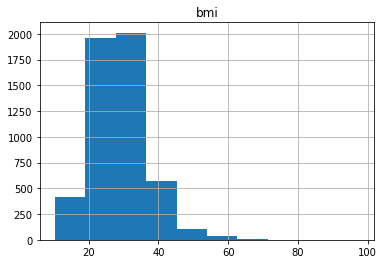

col:  smoking_status


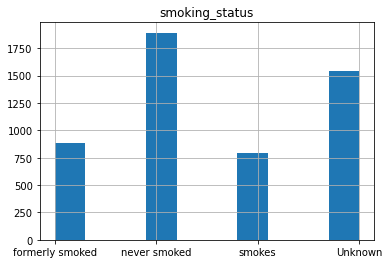

col:  stroke


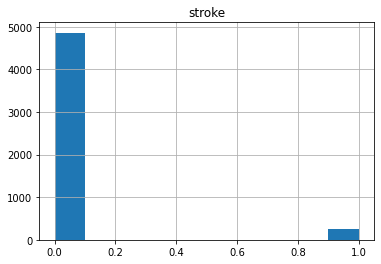

In [ ]:
# %% Show histogram for all columns
columns = dataset.columns
for col in columns:
    print("col: ", col)
    dataset[col].hist()
    plt.title(col)
    plt.show()

In [ ]:
dataset.isnull().sum()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

# Naive Bayes

In [ ]:
accuracy=[]
precision=[]
recall=[]
label=[]

In [ ]:
blnb = BernoulliNB()
#Training the blnb model
blnb.fit(X_train, y_train)

BernoulliNB()

In [ ]:
#Predict y value for test dataset
y_predict = blnb.predict(X_test)
y_prob = blnb.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.86      0.54      0.66      1458
           1       0.66      0.91      0.77      1458

    accuracy                           0.73      2916
   macro avg       0.76      0.73      0.72      2916
weighted avg       0.76      0.73      0.72      2916

Confusion Matrix: [[ 782  676]
 [ 124 1334]]
AUC: 0.7931404897251059
F1 Score 0.7154550085187852
Accuracy 0.7256515775034293


Text(0.5, 1.0, 'BernoulliNB')

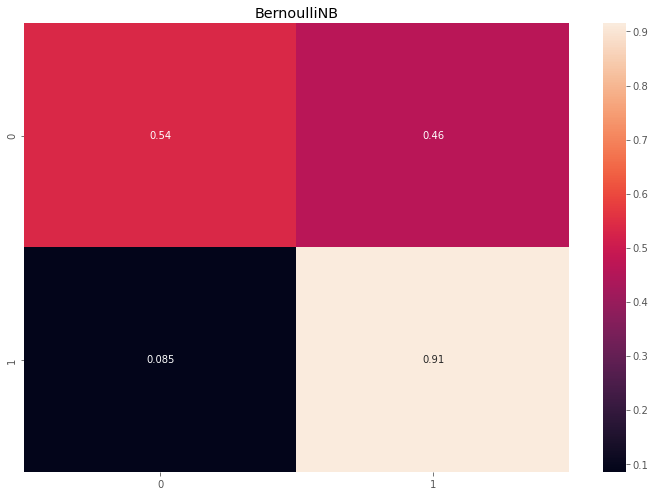

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('BernoulliNB')

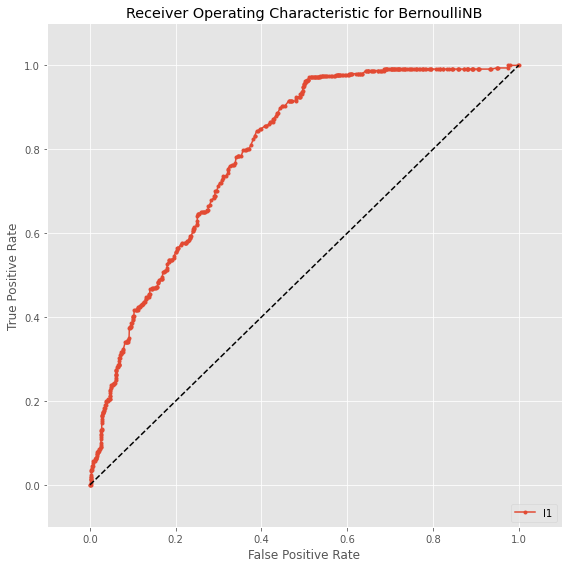

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for BernoulliNB')

# Plot ROC curve
bnbfpr=fpr
bnbtpr=tpr
plt.plot(fpr, tpr, label='l1', marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
import math

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("BernoulliNB")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
print(accuracy)
print(label)
print(precision)
print(recall)

[72.57]
['BernoulliNB']
[77]
[73]


In [ ]:
# training the model on training set
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [ ]:
#Predict y value for test dataset
y_predict = gnb.predict(X_test)
y_prob = gnb.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.97      0.25      0.40      1458
           1       0.57      0.99      0.72      1458

    accuracy                           0.62      2916
   macro avg       0.77      0.62      0.56      2916
weighted avg       0.77      0.62      0.56      2916

Confusion Matrix: [[ 365 1093]
 [  13 1445]]
AUC: 0.8149517067745996
F1 Score 0.5604133545310016
Accuracy 0.620713305898491


Text(0.5, 1.0, 'GaussianNB')

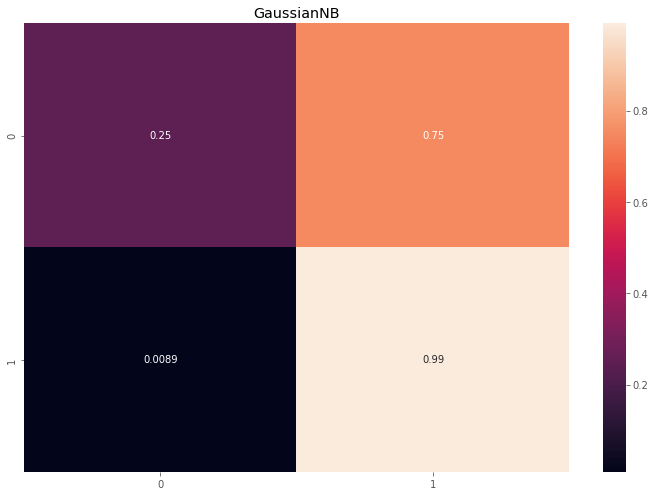

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('GaussianNB')

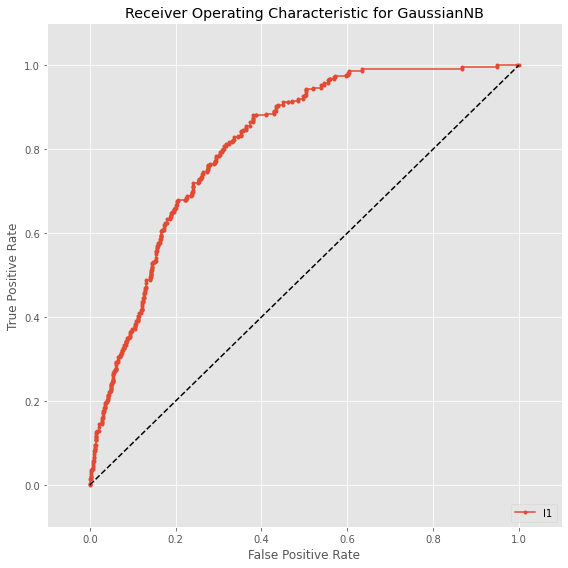

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for GaussianNB')

# Plot ROC curve
gnbfpr=fpr
gnbtpr=tpr
plt.plot(fpr, tpr, label='l1',marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("GaussianNB")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

# KNeighborClassifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(n_neighbors=2)
#Training the KNN model
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=2)

In [ ]:
#Predict y value for test dataset
y_predict = knn.predict(X_test)
y_prob = knn.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1458
           1       0.94      1.00      0.97      1458

    accuracy                           0.97      2916
   macro avg       0.97      0.97      0.97      2916
weighted avg       0.97      0.97      0.97      2916

Confusion Matrix: [[1370   88]
 [   0 1458]]
AUC: 0.9698216735253772
F1 Score 0.9697941641225183
Accuracy 0.9698216735253772


Text(0.5, 1.0, 'KNeighborsClassifier')

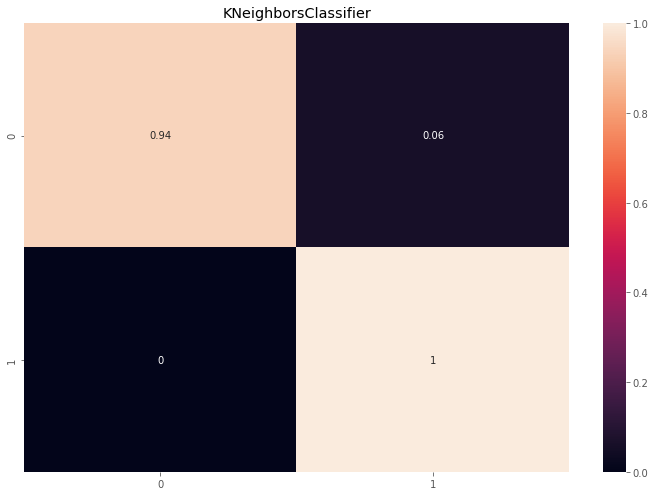

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('KNeighborsClassifier')

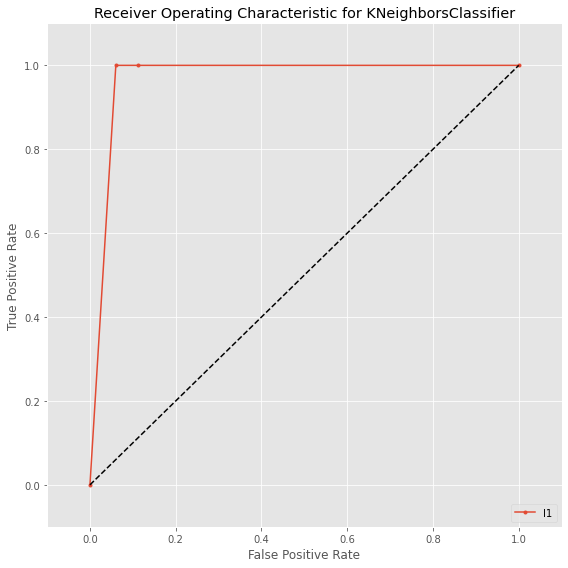

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for KNeighborsClassifier')

# Plot ROC curve
knnfpr=fpr
knntpr=tpr
plt.plot(fpr, tpr, label='l1',marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("KNN")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

# Bagging Classifier

In [ ]:
from sklearn.ensemble import BaggingClassifier
from numpy import mean

In [ ]:
# Setting the second model
bagging = BaggingClassifier(n_estimators=10)

bagging.fit(X_train, y_train)



BaggingClassifier()

In [ ]:
#Predict y value for test dataset
y_predict = bagging.predict(X_test)
y_prob = bagging.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      0.97      0.99      1458
           1       0.97      1.00      0.99      1458

    accuracy                           0.99      2916
   macro avg       0.99      0.99      0.99      2916
weighted avg       0.99      0.99      0.99      2916

Confusion Matrix: [[1416   42]
 [   0 1458]]
AUC: 0.9986282578875171
F1 Score 0.9855937191664514
Accuracy 0.98559670781893


Text(0.5, 1.0, 'Bagging Classifier')

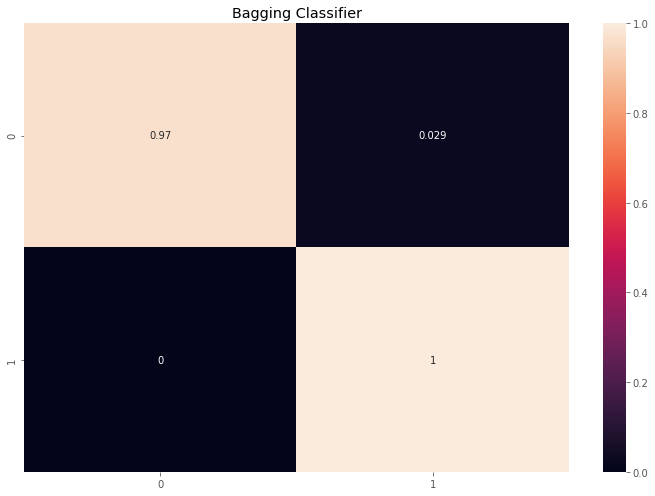

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Bagging Classifier')

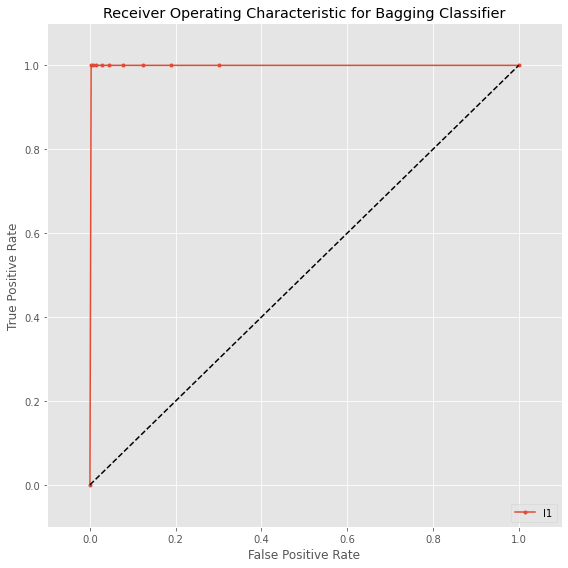

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for Bagging Classifier')

# Plot ROC curve
baggingfpr=fpr
baggingtpr=tpr
plt.plot(fpr, tpr, label='l1',marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracya=[]
labela=[]
precisiona=[]
recalla=[]

In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("Bagging Classifier")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

## Multi-layer Perceptron classifier

In [ ]:
mlp = MLPClassifier(random_state=1, max_iter=300)
mlp.fit(X_train, y_train)

MLPClassifier(max_iter=300, random_state=1)

In [ ]:
#Predict y value for test dataset
y_predict = mlp.predict(X_test)
y_prob = mlp.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")


              precision    recall  f1-score   support

           0       0.98      0.84      0.90      1458
           1       0.86      0.98      0.92      1458

    accuracy                           0.91      2916
   macro avg       0.92      0.91      0.91      2916
weighted avg       0.92      0.91      0.91      2916

Confusion Matrix: [[1223  235]
 [  28 1430]]
AUC: 0.9517288842975984
F1 Score 0.9093511541738872
Accuracy 0.9098079561042524


Text(0.5, 1.0, 'Multi-layer Perceptron')

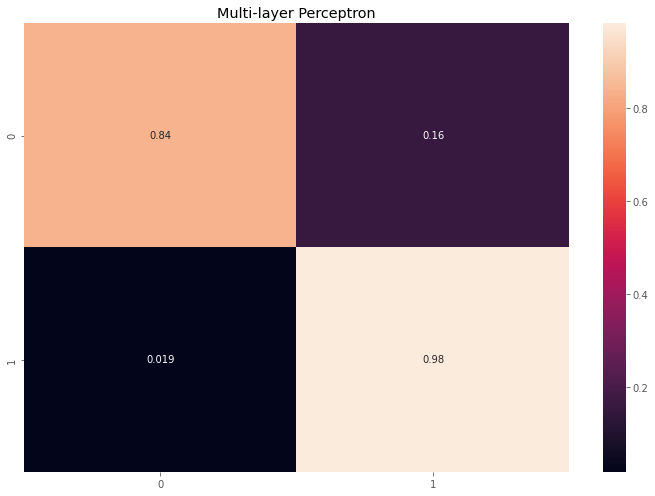

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Multi-layer Perceptron')

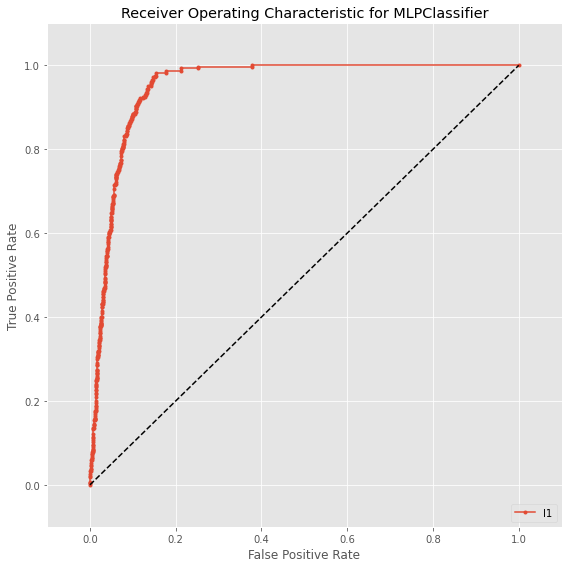

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for MLPClassifier')

# Plot ROC curve
mlpfpr=fpr
mlptpr=tpr
plt.plot(fpr, tpr, label='l1', marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("MLP")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

# Interpret Glassbox



In [ ]:
from interpret.glassbox import (LogisticRegression,
                                ClassificationTree,
                                ExplainableBoostingClassifier)
from interpret import show

**logistic regression**

In [ ]:
# %% Fit logistic regression model
lr = LogisticRegression(random_state=2021, feature_names=feature_names, penalty='l1', solver='liblinear')
lr.fit(X_train, y_train)
print("Training finished.")


Training finished.


In [ ]:
#Predict y value for test dataset
y_predict = lr.predict(X_test)
y_prob = lr.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.81      0.74      0.77      1458
           1       0.76      0.83      0.79      1458

    accuracy                           0.78      2916
   macro avg       0.79      0.78      0.78      2916
weighted avg       0.79      0.78      0.78      2916

Confusion Matrix: [[1078  380]
 [ 247 1211]]
AUC: 0.8497678952132033
F1 Score 0.7845311817391045
Accuracy 0.7849794238683128


Text(0.5, 1.0, 'Logistic Regression')

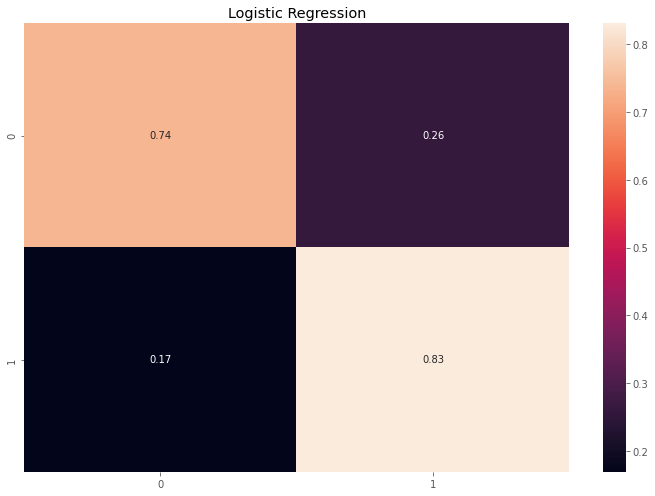

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Logistic Regression')

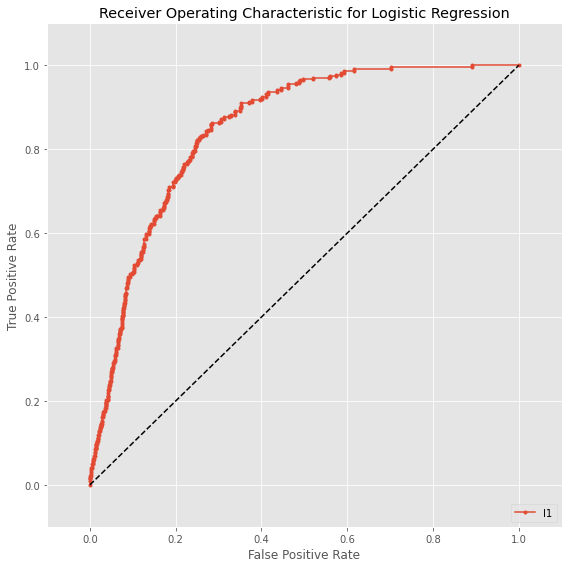

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for Logistic Regression')

# Plot ROC curve
lrfpr=fpr
lrtpr=tpr
plt.plot(fpr, tpr, label='l1', marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("Logistic Regression")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

**Decision tree**

In [ ]:
# %% Fit decision tree model
tree = ClassificationTree()
tree.fit(X_train, y_train)
print("Training finished.")
y_pred = tree.predict(X_test)
print(f"F1 Score {f1_score(y_test, y_pred, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_pred)}")



Training finished.
F1 Score 0.7871368937881495
Accuracy 0.7877229080932785


In [ ]:
#Predict y value for test dataset
y_predict = tree.predict(X_test)
y_prob = tree.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.82      0.74      0.78      1458
           1       0.76      0.84      0.80      1458

    accuracy                           0.79      2916
   macro avg       0.79      0.79      0.79      2916
weighted avg       0.79      0.79      0.79      2916

Confusion Matrix: [[1072  386]
 [ 233 1225]]
AUC: 0.8444514536891208
F1 Score 0.7871368937881495
Accuracy 0.7877229080932785


Text(0.5, 1.0, 'Classification Tree')

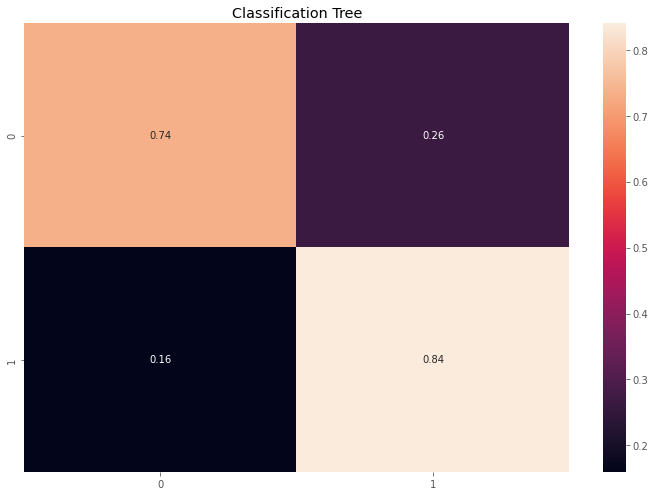

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Classification Tree')

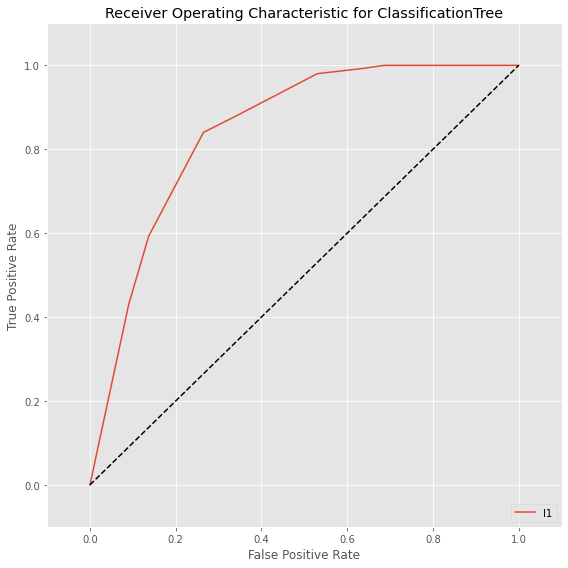

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for ClassificationTree')

# Plot ROC curve
ctfpr=fpr
cttpr=tpr
plt.plot(fpr, tpr, label='l1')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("ClassificationTree")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
# %% Explain local prediction
tree_local = tree.explain_local(X_test[:100], y_test[:100], name='Tree')
show(tree_local)

**Explainable Boosting**

In [ ]:
# %% Fit Explainable Boosting Machine
ebm = ExplainableBoostingClassifier(random_state=201)
ebm.fit(X_train, y_train)
print("Training finished.")

Training finished.


In [ ]:
#Predict y value for test dataset
y_predict = ebm.predict(X_test)
y_prob = ebm.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      0.88      0.94      1458
           1       0.89      1.00      0.94      1458

    accuracy                           0.94      2916
   macro avg       0.95      0.94      0.94      2916
weighted avg       0.95      0.94      0.94      2916

Confusion Matrix: [[1284  174]
 [   4 1454]]
AUC: 0.9698710675314851
F1 Score 0.9387492984552089
Accuracy 0.9389574759945131


Text(0.5, 1.0, 'Explainable Boosting Classifier')

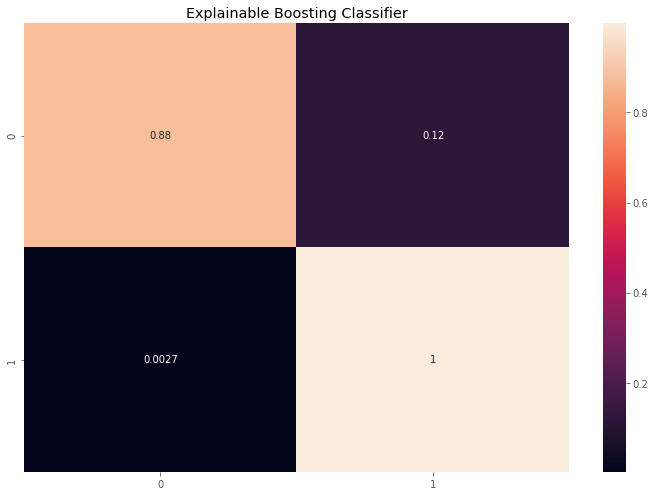

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Explainable Boosting Classifier')

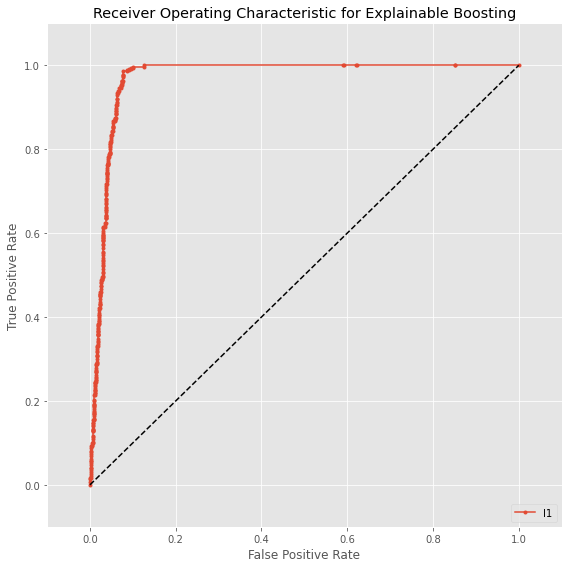

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for Explainable Boosting')

# Plot ROC curve
xbfpr=fpr
xbtpr=tpr
plt.plot(fpr, tpr, label='l1',marker=".")
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
# %% Explain locally
ebm_local = ebm.explain_local(X_test[:100], y_test[:100], name='EBM')
show(ebm_local)

# %% Explain globally
ebm_global = ebm.explain_global(name='EBM')
show(ebm_global)

In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("EBM")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
regr = RandomForestRegressor()
regr.fit(X_train, y_train)


RandomForestRegressor()

In [ ]:
# %% Fit blackbox model
rf = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)

m_rf=rf.fit(X_train, y_train)
rf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=0)

In [ ]:
#Predict y value for test dataset
y_predict = rf.predict(X_test)
y_prob = rf.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1458
           1       0.98      1.00      0.99      1458

    accuracy                           0.99      2916
   macro avg       0.99      0.99      0.99      2916
weighted avg       0.99      0.99      0.99      2916

Confusion Matrix: [[1428   30]
 [   0 1458]]
AUC: 1.0
F1 Score 0.9897108451079937
Accuracy 0.9897119341563786


Text(0.5, 1.0, 'Random Forest Classifier')

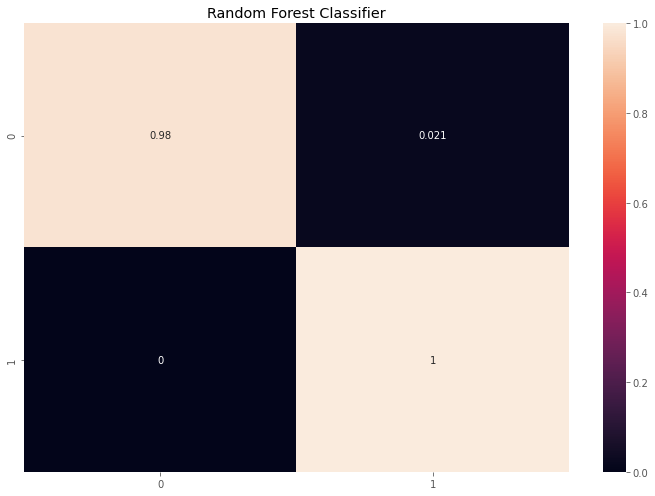

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('Random Forest Classifier')

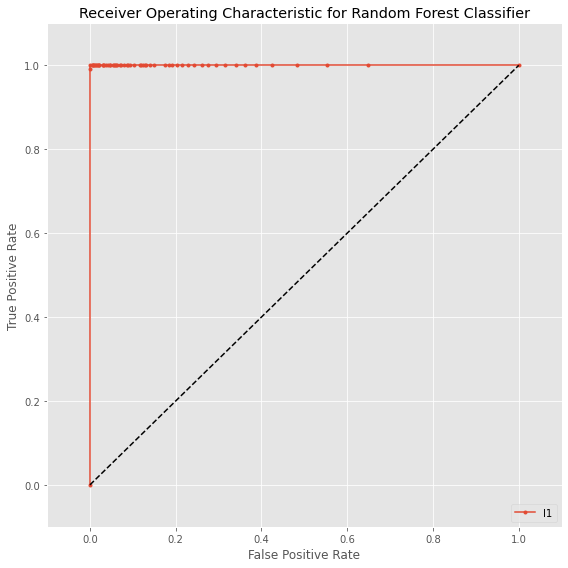

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for Random Forest Classifier')

# Plot ROC curve
rffpr=fpr
rftpr=tpr
plt.plot(fpr, tpr, label='l1',marker=".")
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig("randomforest.png")
plt.show()


In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("Random Forest")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
#del accuracy[6]
#del precision[6]
#del recall[6]
#del label[6]

In [ ]:
label

['BernoulliNB',
 'GaussianNB',
 'KNN',
 'MLP',
 'Logistic Regression',
 'ClassificationTree',
 'Random Forest']

In [ ]:
accuracy

[72.5, 63.07, 96.98, 89.44, 78.74, 78.94, 99.01]

In [ ]:
precision

[76, 77, 98, 91, 79, 80, 100]

In [ ]:
recall

[73, 64, 97, 90, 79, 79, 100]

In [ ]:
labela

['Bagging Classifier', 'EBM']

In [ ]:
accuracya

[98.8, 93.76]

In [ ]:
recalla

[99, 94]

In [ ]:
precisiona

[99, 95]

In [ ]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [ ]:
pca = PCA()

blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

lime = LimeTabular(predict_fn=blackbox_model.predict_proba, data=X_train)
lime_local = lime.explain_local(X_test[:5], y_test[:5], name='Lime')

show(lime_local)

In [ ]:
from interpret.blackbox import PartialDependence
blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

pdp = PartialDependence(predict_fn=blackbox_model.predict_proba, data=X_train)
pdp_global = pdp.explain_global( name='PartialDependence')

show(pdp_global)

In [ ]:
names=X.columns

In [ ]:
names

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status'],
      dtype='object')

In [ ]:
from interpret.blackbox import MorrisSensitivity
blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

msa = MorrisSensitivity(predict_fn=blackbox_model.predict_proba, data=X_train,feature_names=None)
msa_global = msa.explain_global(name='MorrisSensitivity')

show(msa_global)

In [ ]:
from interpret.blackbox import ShapKernel
blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

shap = ShapKernel(predict_fn=blackbox_model.predict_proba, data=X_train)
shap_local = shap.explain_local(X_test[:5], y_test[:5], name='Shap Kernel')

show(shap_local)

  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
show(shap_local)

In [ ]:
import shap

In [ ]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(m_rf)
# Calculate Shap values
shap_values = explainer.shap_values(X_test)

In [ ]:
explainer = shap.KernelExplainer(rf.predict,X_test)

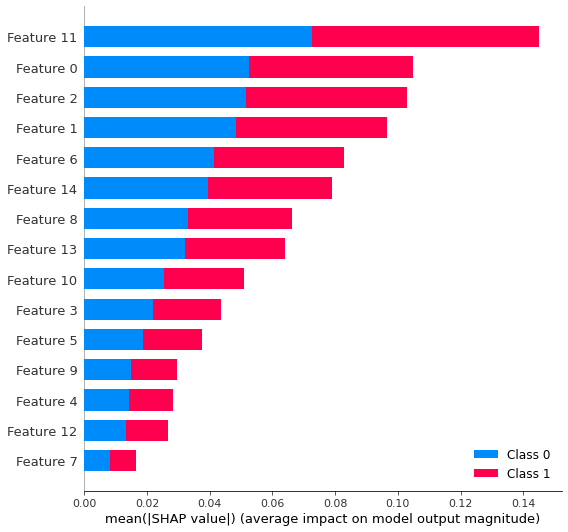

In [ ]:

fig=plt.gcf()
shap.summary_plot(shap_values, X_test, feature_names=None, plot_type="bar")

fig.savefig("2.jpg")

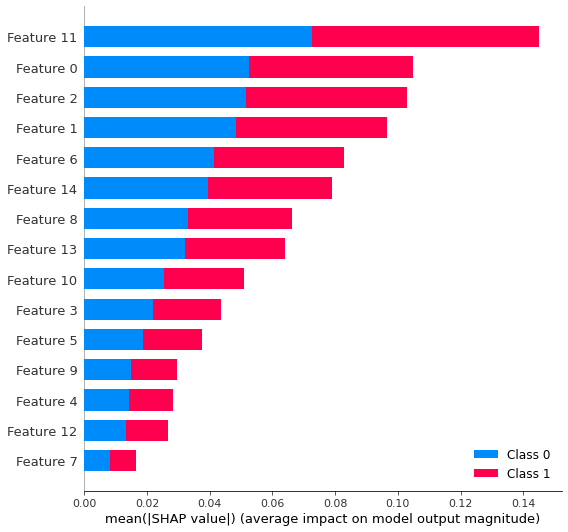

In [ ]:
# %% >> Visualize global features
# Feature summary
shap.summary_plot(shap_values, X_test,show=False)

In [ ]:
# explain the GAM model with SHAP
explainer_rf = shap.Explainer(rf.predict, X_test)
shap_values_rf = explainer_rf(X_test)

Permutation explainer: 2917it [22:49,  2.12it/s]


In [ ]:
import warnings
warnings.filterwarnings("ignore")


In [ ]:
shap_values_rf[1][1]

.values =
0.0

.base_values =
0.0

.data =
2.4469567604520877

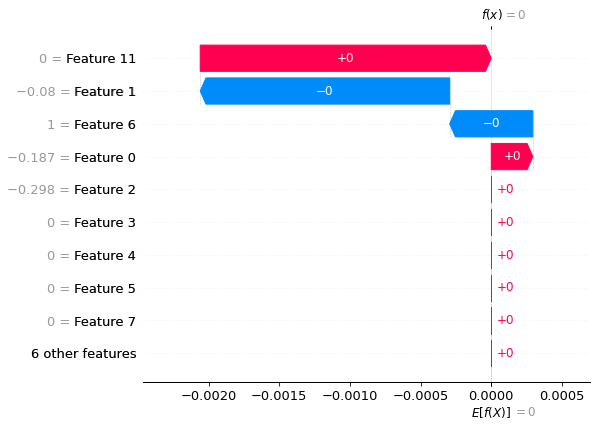

In [ ]:
shap.waterfall_plot(shap_values_rf[3], max_display=10, show=True)

In [ ]:
# visualize the first prediction's explanation with a force plot
shap.initjs()
shap.plots.force(shap_values_rf)

In [ ]:
# visualize all the training set predictions
shap.initjs()
shap.plots.force(shap_values_rf)

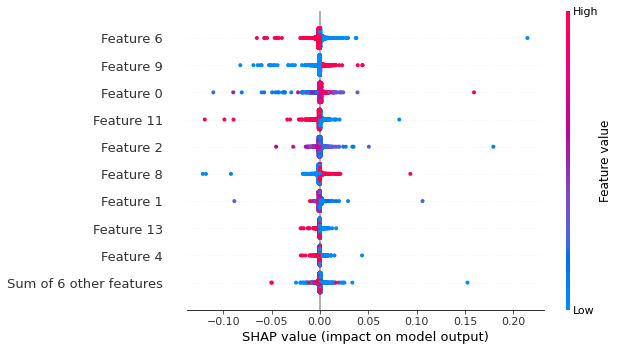

In [ ]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values_rf)

KernelExplainer

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
rf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=0)

In [ ]:
import sklearn

In [ ]:
sklearn.metrics.accuracy_score(y_test, rf.predict(X_test))


0.9900548696844993

In [ ]:
training = np.array(X_train)

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer( X_train, categorical_names=None, discretize_continuous=True)

In [ ]:
i = np.random.randint(0, X_test.shape[0])


In [ ]:
X_test[1]

array([1.22814422, 2.44695676, 0.26053874, 1.        , 1.        ,
       1.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 1.        , 0.        ])

In [ ]:
y_test[1]

1

In [ ]:
exp = explainer.explain_instance(X_test[1], rf.predict_proba, num_features=13, top_labels=None)

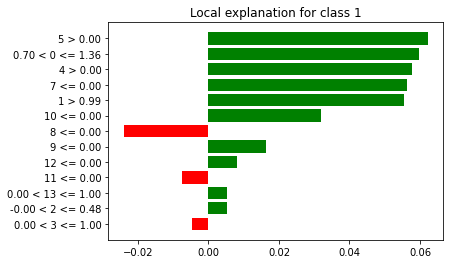

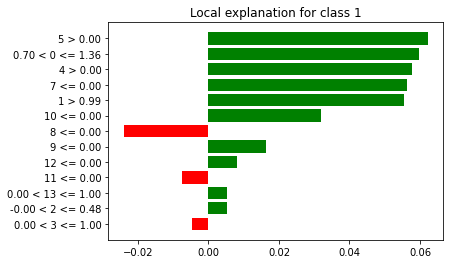

In [ ]:
exp.as_pyplot_figure()

In [ ]:
exp.show_in_notebook(show_table=True, show_all=False)



In [ ]:
exp.as_list()

[('5 > 0.00', 0.06225379582593826),
 ('0.70 < 0 <= 1.36', 0.05984981363204885),
 ('4 > 0.00', 0.05764209293327049),
 ('7 <= 0.00', 0.05644502701643623),
 ('1 > 0.99', 0.05535098220562002),
 ('10 <= 0.00', 0.03186179434896481),
 ('8 <= 0.00', -0.024104602724188462),
 ('9 <= 0.00', 0.016194666985430345),
 ('12 <= 0.00', 0.008019540915136627),
 ('11 <= 0.00', -0.007594736147933125),
 ('0.00 < 13 <= 1.00', 0.005278140197126963),
 ('-0.00 < 2 <= 0.48', 0.005118564411669937),
 ('0.00 < 3 <= 1.00', -0.004676564934875924)]

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc = SVC(C=100, gamma=1000 ,probability= True)
svc.fit(X_train,y_train)

SVC(C=100, gamma=1000, probability=True)

In [ ]:
y_pred_train_svc1 = svc.predict(X_train)
acc_train_svc1 = accuracy_score(y_train, y_pred_train_svc1)

y_pred_test_svc1 = svc.predict(X_test)
acc_test_svc1 = accuracy_score(y_test, y_pred_test_svc1)

print(acc_train_svc1)
print(acc_test_svc1)

1.0
1.0


In [ ]:
#Predict y value for test dataset
y_predict = svc.predict(X_test)
y_prob = svc.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1458
           1       1.00      1.00      1.00      1458

    accuracy                           1.00      2916
   macro avg       1.00      1.00      1.00      2916
weighted avg       1.00      1.00      1.00      2916

Confusion Matrix: [[1458    0]
 [   0 1458]]
AUC: 1.0
F1 Score 1.0
Accuracy 1.0


[20:09:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


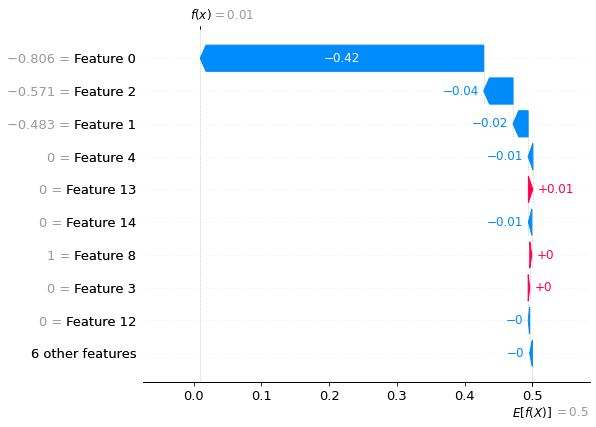

In [ ]:
import xgboost
import shap

# train an XGBoost model

model = xgboost.XGBRegressor()
model.fit(X_train, y_train)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

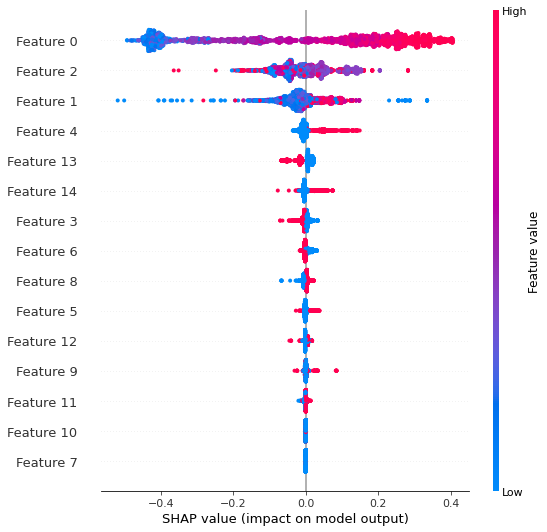

In [ ]:
# %% >> Visualize global features
# Feature summary
shap.summary_plot(shap_values, X_test,show=False)


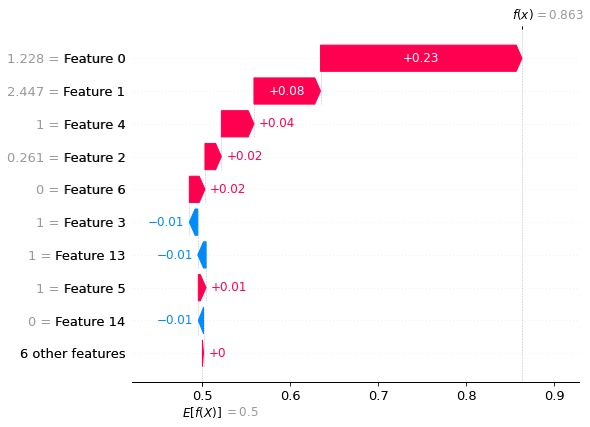

In [ ]:
shap.plots.waterfall(shap_values[1])

In [ ]:
# visualize the first prediction's explanation with a force plot
shap.initjs()
shap.plots.force(shap_values[1])

In [ ]:
# visualize all the training set predictions
shap.initjs()
fig=plt.gcf()
shap.plots.force(shap_values)


<Figure size 432x288 with 0 Axes>

In [ ]:
from sklearn.model_selection import cross_val_score, KFold

In [ ]:
# Initilize Lime for Tabular data
lime = LimeTabular(predict_fn=rf.predict_proba,
                   data=X_train,
                   random_state=20)
# Get local explanations
lime_local = lime.explain_local(X_test[-20:],
                                y_test[-20:],
                                name='LIME')

show(lime_local)

In [ ]:
from interpret.privacy import DPExplainableBoostingClassifier, DPExplainableBoostingRegressor

dp_ebm = DPExplainableBoostingClassifier(epsilon=1, delta=1e-5) # Specify privacy parameters
dp_ebm.fit(X_train, y_train)

show(dp_ebm.explain_global()) # Identical function calls to standard EBMs

In [ ]:
#Predict y value for test dataset
y_predict = dp_ebm.predict(X_test)
y_prob = dp_ebm.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.80      0.71      0.75      1458
           1       0.74      0.82      0.78      1458

    accuracy                           0.77      2916
   macro avg       0.77      0.77      0.77      2916
weighted avg       0.77      0.77      0.77      2916

Confusion Matrix: [[1037  421]
 [ 260 1198]]
AUC: 0.8315575012089771
F1 Score 0.7657468000686551
Accuracy 0.7664609053497943


In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("DP Explainable")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
# %% Create SHAP explainer
explainer = shap.TreeExplainer(rf)
# Calculate shapley values for test data
start_index = 1
end_index = 2
shap_values = explainer.shap_values(X_test[start_index:end_index])
X_test[start_index:end_index]

array([[1.22814422, 2.44695676, 0.26053874, 1.        , 1.        ,
        1.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 1.        , 0.        ]])

In [ ]:
# %% Investigating the values (classification problem)
# class 0 = contribution to class 1
# class 1 = contribution to class 2
print(shap_values[0].shape)
shap_values


(1, 15)


[array([[-0.11138949, -0.06936962,  0.02011112,  0.01532855, -0.09346636,
         -0.1216088 , -0.07449884, -0.00022407, -0.01857015, -0.01705217,
         -0.00975998,  0.00906335, -0.01145178, -0.01729056,  0.000339  ]]),
 array([[ 0.11138949,  0.06936962, -0.02011112, -0.01532855,  0.09346636,
          0.1216088 ,  0.07449884,  0.00022407,  0.01857015,  0.01705217,
          0.00975998, -0.00906335,  0.01145178,  0.01729056, -0.000339  ]])]

The RF predicted: 1


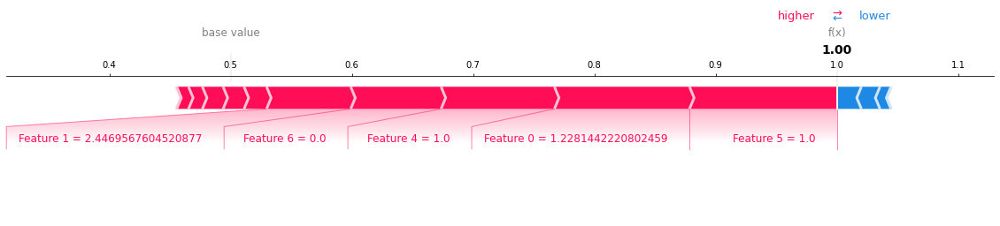

In [ ]:
# Force plot
shap.initjs()
prediction = rf.predict(X_test[start_index:end_index])[0]
print(f"The RF predicted: {prediction}")
shap.force_plot(explainer.expected_value[1],
                shap_values[1],
                X_test[start_index:end_index],show=False,matplotlib=True).savefig('111.jpg')

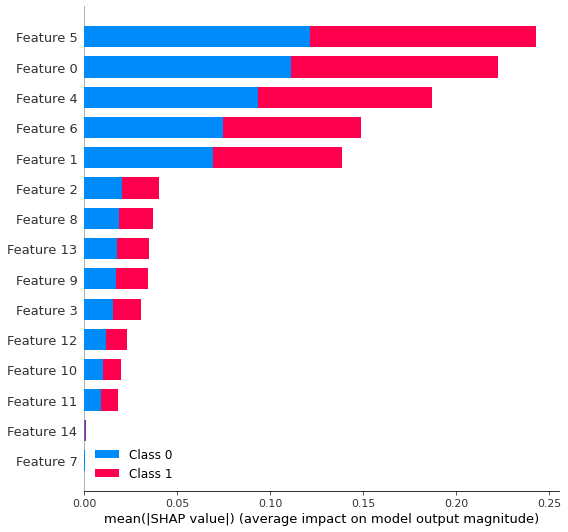

In [ ]:
# %% >> Visualize global features
# Feature summary
shap.summary_plot(shap_values, X_test,show=False)


In [ ]:
!pip install dice-ml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.6 MB 33.9 MB/s 


In [ ]:
# %% Create diverse counterfactual explanations
import dice_ml

In [ ]:
from sklearn import  svm
SVM = svm.SVC(probability=True)
SVM.fit(X_train, y_train)
y_pred = SVM.predict(X_test)
#y_prob = SVM.predict_proba(X_val_vectors_tfidf)[:,1]
print(f"F1 Score {f1_score(y_test, y_pred, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_pred)}")


F1 Score 0.8337760415311538
Accuracy 0.8347050754458162


In [ ]:
#Predict y value for test dataset
y_predict = SVM.predict(X_test)
y_prob = SVM.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       0.89      0.76      0.82      1458
           1       0.79      0.91      0.85      1458

    accuracy                           0.83      2916
   macro avg       0.84      0.83      0.83      2916
weighted avg       0.84      0.83      0.83      2916

Confusion Matrix: [[1108  350]
 [ 132 1326]]
AUC: 0.9063221505303505
F1 Score 0.8337760415311538
Accuracy 0.8347050754458162


Text(0.5, 1.0, 'SVM')

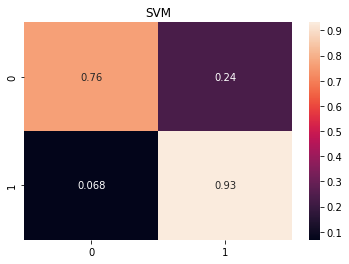

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('SVM')


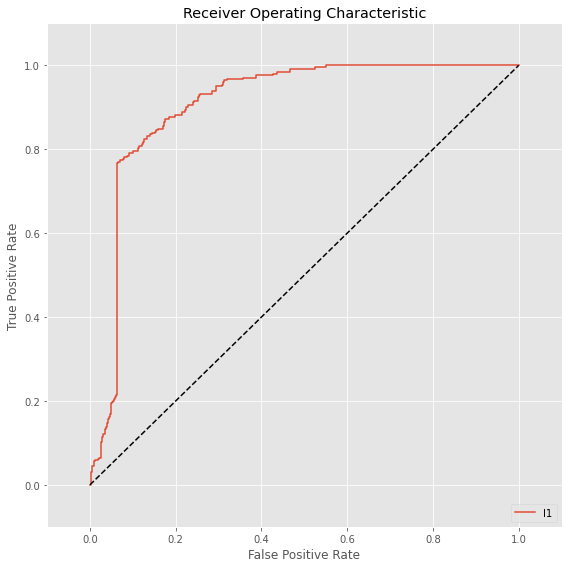

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic')

# Plot ROC curve
svmfpr=fpr
svmtpr=tpr
plt.plot(fpr, tpr, label='l1')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
accuracy.append(round(accuracy_score(y_test, y_predict)*100 ,2))
label.append("SVM")
precision.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recall.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
adabost = AdaBoostClassifier( DecisionTreeClassifier(max_depth=2), n_estimators=500)
adabost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                   n_estimators=500)

In [ ]:
#Predict y value for test dataset
y_predict = adabost.predict(X_test)
y_prob = adabost.predict_proba(X_test)[:,1]


print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")
print(f"Accuracy {accuracy_score(y_test, y_predict)}")

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1458
           1       0.95      1.00      0.97      1458

    accuracy                           0.97      2916
   macro avg       0.98      0.97      0.97      2916
weighted avg       0.98      0.97      0.97      2916

Confusion Matrix: [[1382   76]
 [   0 1458]]
AUC: 0.9903197156410589
F1 Score 0.9739191835505009
Accuracy 0.9739368998628258


Text(0.5, 1.0, 'AdaBoost Classifier')

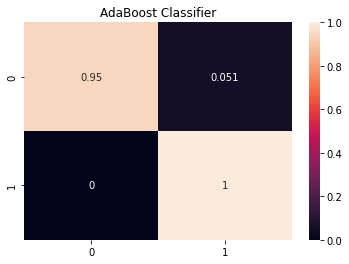

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('AdaBoost Classifier')

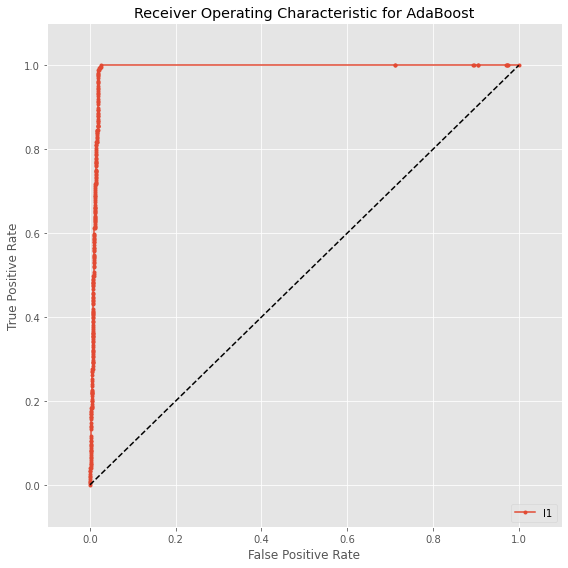

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for AdaBoost')

# Plot ROC curve
adaboostfpr=fpr
adaboosttpr=tpr
plt.plot(fpr, tpr, label='l1',marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig('adaboost.png')
plt.show()

In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("Ada Boost")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier
# instantiate the model
xgb = XGBClassifier(use_label_encoder =False,learning_rate=0.4,max_depth=7)
#fit the model
xgb.fit(X_train, y_train)
#predicting the target value from the model for the samples
y_predict = xgb.predict(X_test)
y_pred = xgb.predict_proba(X_test)[:,1]
print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test, y_predict))


fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)
print(f"Accuracy {accuracy_score(y_test, y_predict)}")
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")

              precision    recall  f1-score   support

           0       1.00      0.95      0.98      1458
           1       0.96      1.00      0.98      1458

    accuracy                           0.98      2916
   macro avg       0.98      0.98      0.98      2916
weighted avg       0.98      0.98      0.98      2916

Confusion Matrix: [[1392   66]
 [   0 1458]]
AUC: 0.9990817419054985
Accuracy 0.977366255144033
F1 Score 0.9773546542412368


Text(0.5, 1.0, 'XGB Classifier')

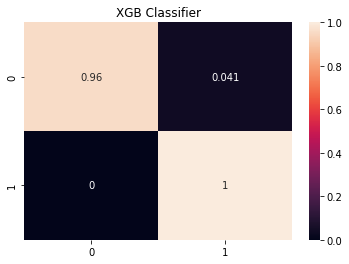

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_predict,normalize='true'),annot=True)
plt.title('XGB Classifier')


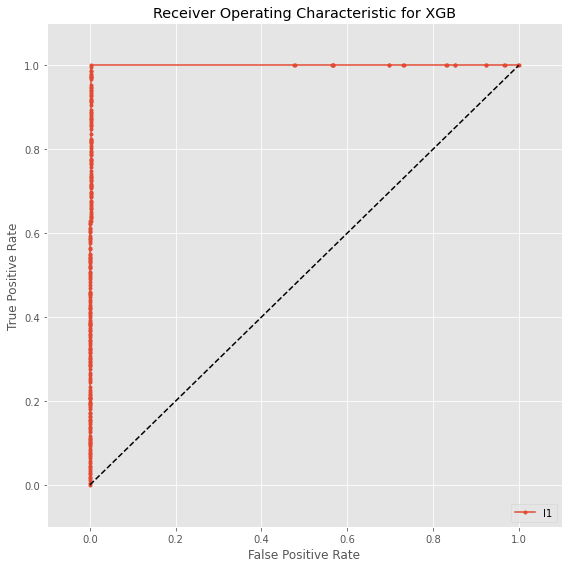

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for XGB')

# Plot ROC curve
xgbfpr=fpr
xgbtpr=tpr
plt.plot(fpr, tpr, label='l1',marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig('xgb.png')
plt.show()

In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("XGB")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

In [ ]:
estimators = [ ('rf', rf),
              ('knn', knn),
              ('gnb', xgb),
              ('svm',SVM)]

In [ ]:
estimators1 = [ ('rf', rf),
              ('knn', knn),
              ('gnb', xgb),
              ('svm',SVM)]

In [ ]:
from sklearn.ensemble import StackingClassifier

reg = StackingClassifier(
    estimators=estimators,
    final_estimator=None)

In [ ]:
reg.fit(X_train, y_train)

StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(criterion='entropy',
                                                       random_state=0)),
                               ('knn', KNeighborsClassifier(n_neighbors=2)),
                               ('gnb',
                                XGBClassifier(learning_rate=0.4, max_depth=7,
                                              use_label_encoder=False)),
                               ('svm', SVC(probability=True))])

In [ ]:
y_predict = reg.predict(X_test)
y_pred = reg.predict_proba(X_test)[:,1]
print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test,y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")


# Evaluate test set accuracy
accur =accuracy_score(y_test, y_predict)



# Print acc_test and acc_oob
print('Test set accuracy: {:.3f}'.format(accur))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1458
           1       1.00      1.00      1.00      1458

    accuracy                           1.00      2916
   macro avg       1.00      1.00      1.00      2916
weighted avg       1.00      1.00      1.00      2916

Confusion Matrix: [[1456    2]
 [   0 1458]]
AUC: 1.0
F1 Score 0.9993141286211116
Test set accuracy: 0.999


In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("RF+KNN+XGB+SVM")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

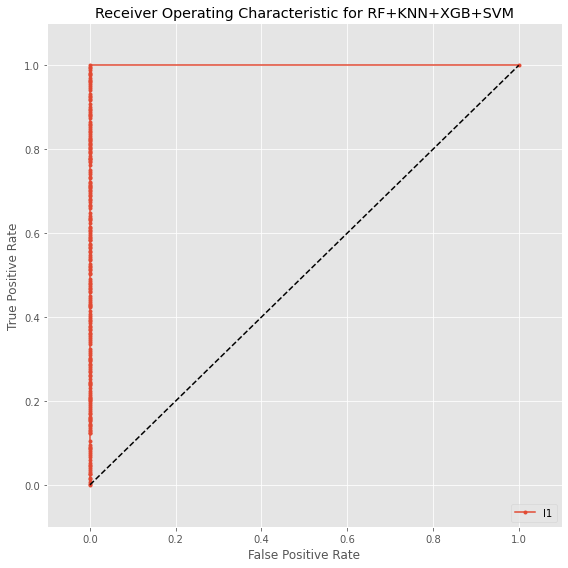

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for RF+KNN+XGB+SVM')

# Plot ROC curve
stackingrkxsfpr=fpr
stackingrkxstpr=tpr
plt.plot(fpr, tpr, label='l1', marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig("ensemble1.png")
plt.show()

In [ ]:
from sklearn.ensemble import StackingClassifier

reg = StackingClassifier(
    estimators=estimators1,
    final_estimator=rf)

In [ ]:
reg.fit(X_train, y_train)

StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(criterion='entropy',
                                                       random_state=0)),
                               ('knn', KNeighborsClassifier(n_neighbors=2)),
                               ('gnb',
                                XGBClassifier(learning_rate=0.4, max_depth=7,
                                              use_label_encoder=False)),
                               ('svm', SVC(probability=True))],
                   final_estimator=RandomForestClassifier(criterion='entropy',
                                                          random_state=0))

In [ ]:

# Predict test set labels
y_pred = reg.predict(X_test)

# Evaluate test set accuracy
ada_test = accuracy_score(y_test, y_pred)



# Print acc_test and acc_oob
print('Test set accuracy: {:.3f}'.format(ada_test))

Test set accuracy: 1.000


In [ ]:
accuracya.append(round(accuracy_score(y_test, y_pred)*100 ,2))
labela.append("RF(FE)+KNN+XGB+SVM")
precisiona.append(math.ceil(precision_score(y_test, y_pred, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_pred,  average='macro')*100))

In [ ]:
estimators2 = [ ('rf', rf),
              ('Bagging', bagging),
              ('gnb', xgb),
              ('adabst',adabost)]

In [ ]:
from sklearn.ensemble import StackingClassifier

reg = StackingClassifier(
    estimators=estimators2,
    final_estimator=bagging)

In [ ]:
reg.fit(X_train, y_train)

StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(criterion='entropy',
                                                       random_state=0)),
                               ('Bagging', BaggingClassifier()),
                               ('gnb',
                                XGBClassifier(learning_rate=0.4, max_depth=7,
                                              use_label_encoder=False)),
                               ('adabst',
                                AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2),
                                                   n_estimators=500))],
                   final_estimator=BaggingClassifier())

In [ ]:
y_predict = reg.predict(X_test)
y_pred = reg.predict_proba(X_test)[:,1]
print(classification_report(y_test,y_predict))
print('Confusion Matrix:',confusion_matrix(y_test,y_predict))

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)
print(f"F1 Score {f1_score(y_test, y_predict, average='macro')}")


# Evaluate test set accuracy
accur =accuracy_score(y_test, y_predict)



# Print acc_test and acc_oob
print('Test set accuracy: {:.3f}'.format(accur))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1458
           1       1.00      1.00      1.00      1458

    accuracy                           1.00      2916
   macro avg       1.00      1.00      1.00      2916
weighted avg       1.00      1.00      1.00      2916

Confusion Matrix: [[1458    0]
 [   0 1458]]
AUC: 1.0
F1 Score 1.0
Test set accuracy: 1.000


In [ ]:
accuracya.append(round(accuracy_score(y_test, y_predict)*100 ,2))
labela.append("Bagging(FE)+RF+XGB+AdaBoost")
precisiona.append(math.ceil(precision_score(y_test, y_predict, average='macro')*100))
recalla.append(math.ceil(recall_score(y_test, y_predict,  average='macro')*100))

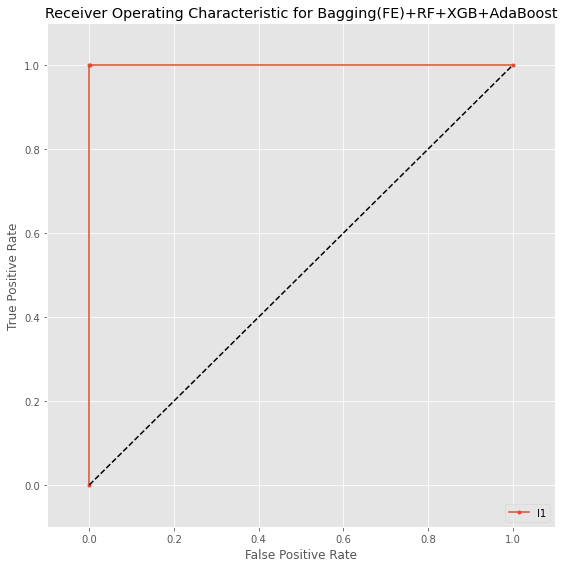

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic for Bagging(FE)+RF+XGB+AdaBoost')

# Plot ROC curve
stackingbfxafpr=fpr
stackingbfxatpr=tpr
plt.plot(fpr, tpr, label='l1', marker='.')
plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.savefig("ensemble2.png")
plt.show()

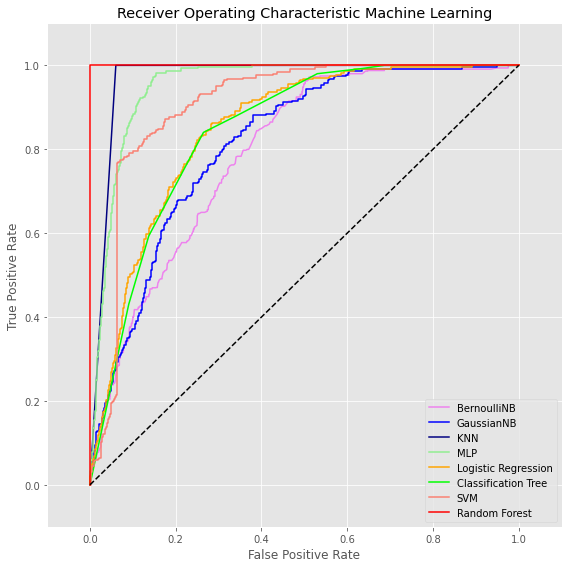

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
plt.title('Receiver Operating Characteristic Machine Learning')

# Plot ROC curve
plt.plot(bnbfpr, bnbtpr, label='BernoulliNB', color='violet')
plt.plot(gnbfpr, gnbtpr, label='GaussianNB', color='blue')
plt.plot(knnfpr, knntpr, label='KNN', color='navy')
plt.plot(mlpfpr, mlptpr, label='MLP', color='lightgreen')
plt.plot(lrfpr, lrtpr, label='Logistic Regression', color='orange')
plt.plot(ctfpr, cttpr, label='Classification Tree', color='lime')
plt.plot(svmfpr, svmtpr, label='SVM', color='salmon')
plt.plot(rffpr, rftpr, label='Random Forest', color='red')

plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.savefig("roc for ml.png")
plt.show()

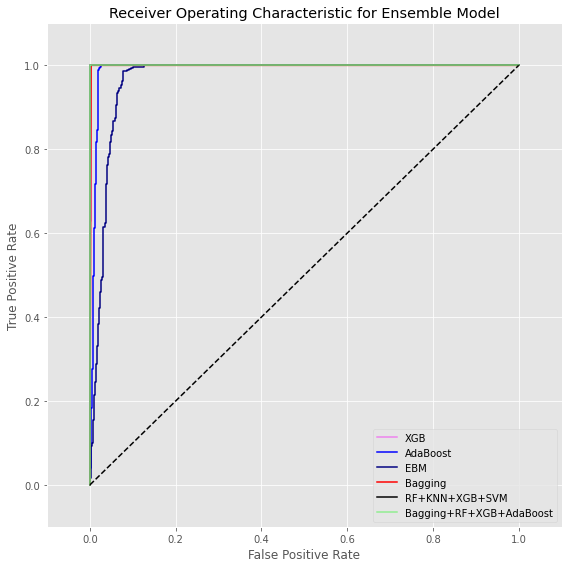

In [ ]:
# Plot the ROC curve
fig = plt.figure(figsize=(8,8))
th = np.linspace(0, 2*np.pi, 128)
plt.title('Receiver Operating Characteristic for Ensemble Model')

# Plot ROC curve
plt.plot(xgbfpr, xgbtpr, label='XGB', color='violet')
plt.plot(adaboostfpr, adaboosttpr, label='AdaBoost', color='blue')
plt.plot(xbfpr, xbtpr, label='EBM', color='navy')
plt.plot(baggingfpr, baggingtpr, label='Bagging', color='red')
plt.plot(stackingrkxsfpr, stackingrkxstpr, label='RF+KNN+XGB+SVM', color='black')
plt.plot(stackingbfxafpr, stackingbfxatpr, label='Bagging+RF+XGB+AdaBoost', color='lightgreen')

plt.legend(loc='lower right')

# Diagonal 45 degree line
plt.plot([0,1],[0,1],'k--')

# Axes limits and labels
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.savefig("roc for ensemble.png")
plt.show()

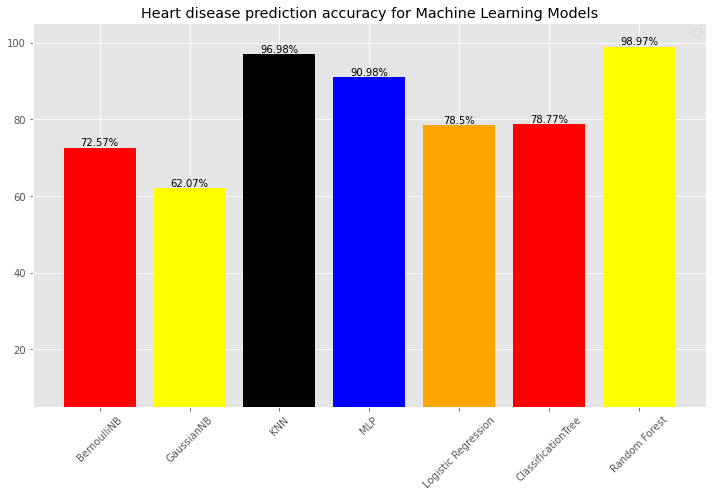

In [ ]:
from matplotlib import rcParams
rcParams['figure.figsize']=10,7

plt.rcParams["figure.autolayout"] = True

plt.figure()
c = ['red', 'yellow', 'black', 'blue', 'orange']
p1 = plt.bar(np.arange(len(accuracy)), accuracy,color=c)

for rect1 in p1:
    height = rect1.get_height()
    plt.annotate( "{}%".format(height),(rect1.get_x() + rect1.get_width()/2, height+.05),ha="center",va="bottom" )
plt.ylim(bottom=5,top=105)

plt.xticks(rotation=45)
plt.title("Heart disease prediction accuracy for Machine Learning Models")
plt.bar(label,accuracy,color=c)
plt.legend()
plt.savefig("sample.jpg")

plt.show()

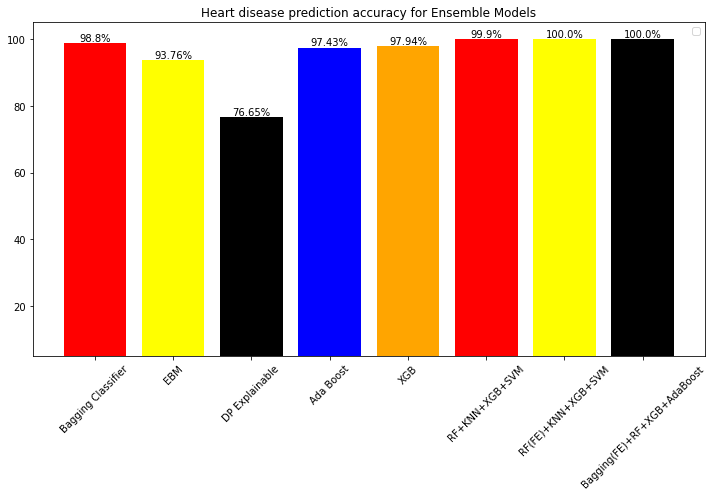

In [ ]:
from matplotlib import rcParams
rcParams['figure.figsize']=10,7

plt.rcParams["figure.autolayout"] = True

plt.figure()
c = ['red', 'yellow', 'black', 'blue', 'orange']
p1 = plt.bar(np.arange(len(accuracya)), accuracya,color=c)

for rect1 in p1:
    height = rect1.get_height()
    plt.annotate( "{}%".format(height),(rect1.get_x() + rect1.get_width()/2, height+.05),ha="center",va="bottom" )
plt.ylim(bottom=5,top=105)

plt.xticks(rotation=45)
plt.title("Heart disease prediction accuracy for Ensemble Models")
plt.bar(labela,accuracya,color=c)
plt.legend()
plt.savefig("sample1.jpg")

plt.show()

In [ ]:
from matplotlib import style

In [ ]:
xpos=np.arange(len(accuracy))

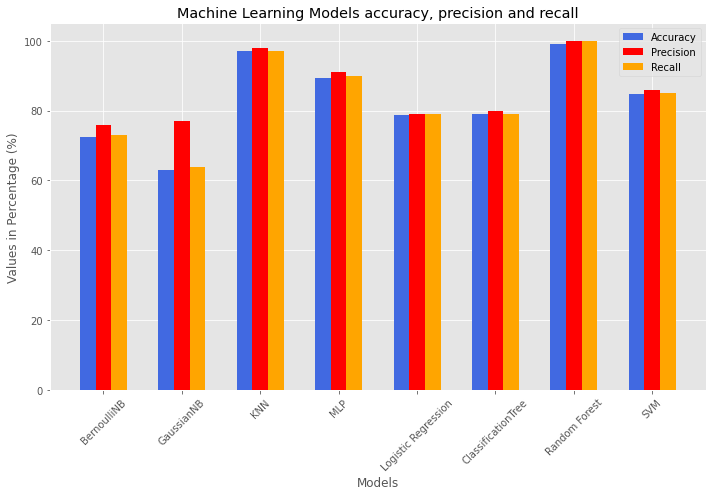

In [ ]:
style.use('ggplot')
plt.figure(figsize=(10,7))
barWidth=0.2
plt.bar(xpos,accuracy,color='royalblue', width=barWidth, label='Accuracy')
plt.bar(xpos+0.2,precision,color='red', width=barWidth, label='Precision')
plt.bar(xpos+0.4,recall,color='orange', width=barWidth, label='Recall')
plt.xticks(rotation=45)
plt.xticks(xpos+0.2,label)
plt.xlabel("Models")
plt.ylabel("Values in Percentage (%)")
plt.title("Machine Learning Models accuracy, precision and recall")
plt.legend()
plt.savefig("machinecom.jpg")

In [ ]:
xpos=np.arange(len(accuracya))

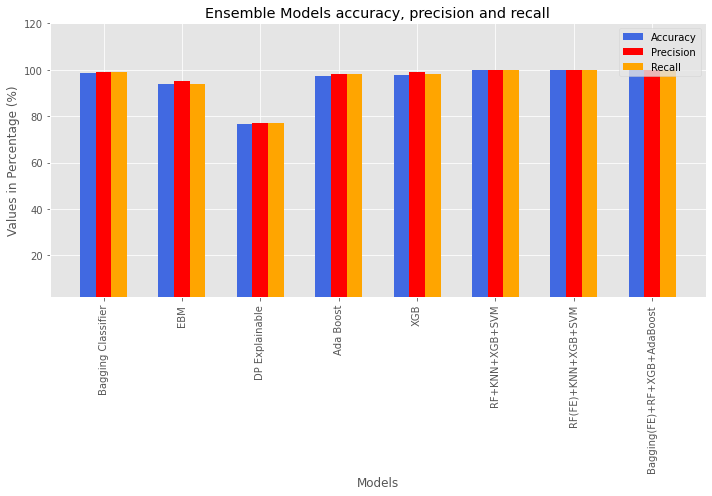

In [ ]:
style.use('ggplot')
plt.figure(figsize=(10,7))
barWidth=0.2
plt.bar(xpos,accuracya,color='royalblue', width=barWidth, label='Accuracy')
plt.bar(xpos+0.2,precisiona,color='red', width=barWidth, label='Precision')
plt.bar(xpos+0.4,recalla,color='orange', width=barWidth, label='Recall')
plt.xticks(rotation=90)
plt.xticks(xpos+0.2,labela)
plt.xlabel("Models")
plt.ylabel("Values in Percentage (%)")
plt.title("Ensemble Models accuracy, precision and recall")
plt.ylim(bottom=2,top=120)
plt.legend()
plt.savefig("ensemblecom.jpg")

In [ ]:
models = [ XGBClassifier(use_label_encoder =False,learning_rate=0.4,max_depth=7),
           AdaBoostClassifier( DecisionTreeClassifier(max_depth=2), n_estimators=500),
           ExplainableBoostingClassifier(random_state=201),
           DPExplainableBoostingClassifier(epsilon=1, delta=1e-5),
           BaggingClassifier(n_estimators=10),
           StackingClassifier(estimators=estimators, final_estimator=None),
           StackingClassifier(estimators=estimators1, final_estimator=rf),
           StackingClassifier(estimators=estimators2, final_estimator=adabost)]

model_names=['XGB','AdaBoost','EBM', 'DPEBC','Bagging',' RF+KNN+XGB+SVM','RF(FE)+KNN+XGB+SVM','Bagging(FE)+RF+XGB+AdaBoost']

In [ ]:
def build_models(models, model_names):
    # lets create an empty lists to append the results
    roc_auc_scores  = []
    accuracy_scores = []
    results = {}

    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10,10))
    # use enumerate() and zip() function to iterate the lists
    for idx, (ml_model_names, ml_models, ax) in enumerate(zip(model_names, models, axes.flatten())):
        clf = models[idx]
        clf.fit(X_train,y_train)
        y_pred = clf.predict(X_test)
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        roc_auc = roc_auc_score(y_test, y_pred_proba)
        accuracy = accuracy_score(y_test, y_pred)

        plot_confusion_matrix(clf,
                              X_test,
                              y_test,
                              ax=ax,
                              cmap='Blues')
        ax.title.set_text(ml_model_names)

        #print("Model: {}".format(ml_model_names))
        #print("Accuracy: {}".format(accuracy))
        #print("Roc Auc Score: {}".format(roc_auc))
        #print('\n')


        roc_auc_scores.append(roc_auc)
        accuracy_scores.append(accuracy)

    results = {'Model':model_names,
           'ROC AUC Score':roc_auc_scores,
           'Accuracy Score':accuracy_scores}
    plt.tight_layout()
    plt.show()
    # Put the roc_auc_scores and accuracy scores in a data frame.
    models_scores_df = pd.DataFrame(results)
    return models_scores_df

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, plot_confusion_matrix

import warnings
warnings.filterwarnings('ignore')

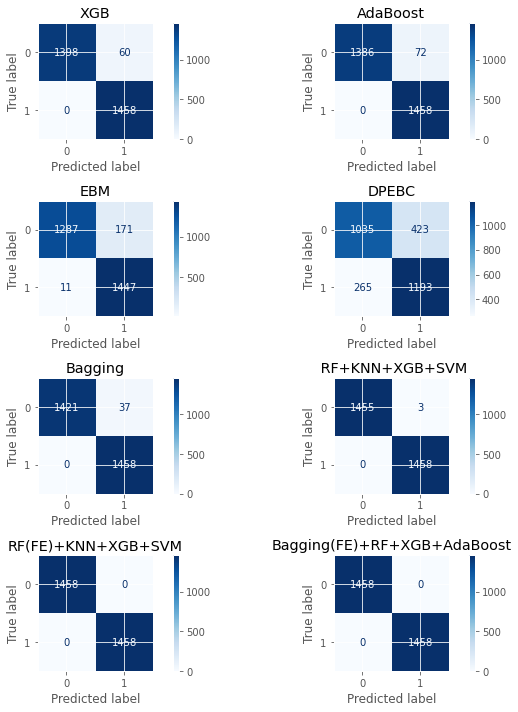

In [ ]:
models_scores_df = build_models(models, model_names)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import XGBRegressor,XGBClassifier
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_lst = {
    "learning_rate" : [00.1,0.1,0.15,0.3,0.5],
    "n_estimators" : [100,500,1000,2000,3000],
    "max_depth" : [3,6,9],
    "min_child_weight" : [1,5,10,20],
    "reg_alpha" : [0.001,0.01,0.1],
    "reg_lambda" : [0.001,0.01,0.1]
}

In [ ]:
xgb = XGBClassifier(booster='gbtree', objective='reg:squarederror')

In [ ]:
xgb_clas = RandomizedSearchCV(estimator=xgb,param_distributions=param_lst,
                            n_iter = 5,scoring="neg_root_mean_squared_error",cv = 5)

In [ ]:
xgb_clas = xgb_clas.fit(X_train,y_train)

best_param = xgb_clas.best_params_

xgb = XGBClassifier(**best_param)

In [ ]:
def mean_cross_value(model,X,y):
    score = cross_val_score(model,X,y,cv=5)
    mean = score.mean()
    return mean

In [ ]:
xgb.fit(X_train,y_train)
preds = xgb.predict(X_test)
mae_xgb = mean_absolute_error(y_test,preds)
rmse_xgb = np.sqrt(mean_absolute_error(y_test,preds))
score_xgb = xgb.score(X_test,y_test)
cv_xgb = mean_cross_value(xgb,X,y)


In [ ]:
model_performances = pd.DataFrame({
    "Model":["XGBoost"],
    "CV(5)" : [str(cv_xgb)],
    "MAE" : [str(mae_xgb)],
    "RMSE" : [str(rmse_xgb)],
    "Score" : [str(score_xgb)]
})

In [ ]:
model_performances


,Model,CV(5),MAE,RMSE,Score
0,XGBoost,nan,0.028463648834019206,0.16871173294711664,0.9715363511659808
